In [1]:
import numpy as np
import matplotlib.pyplot as plt
% matplotlib inline
plt.rcParams["figure.dpi"] = 300

In [5]:
from sklearn.datasets import load_boston
boston = load_boston()
from sklearn.model_selection import train_test_split
X, y = boston.data, boston.target
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [17]:
print(boston.DESCR)

Boston House Prices dataset

Notes
------
Data Set Characteristics:  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive
    
    :Median Value (attribute 14) is usually the target

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pupil-teacher ratio by town
      

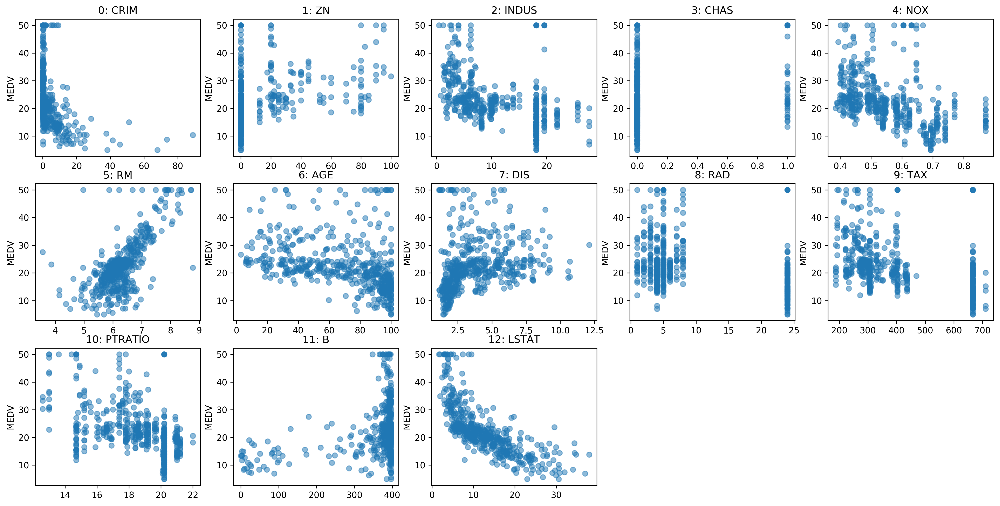

In [6]:
fig, axes = plt.subplots(3, 5, figsize=(20, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 12:
        ax.set_visible(False)
        continue
    ax.plot(X[:, i], y, 'o', alpha=.5)
    ax.set_title("{}: {}".format(i, boston.feature_names[i]))
    ax.set_ylabel("MEDV")

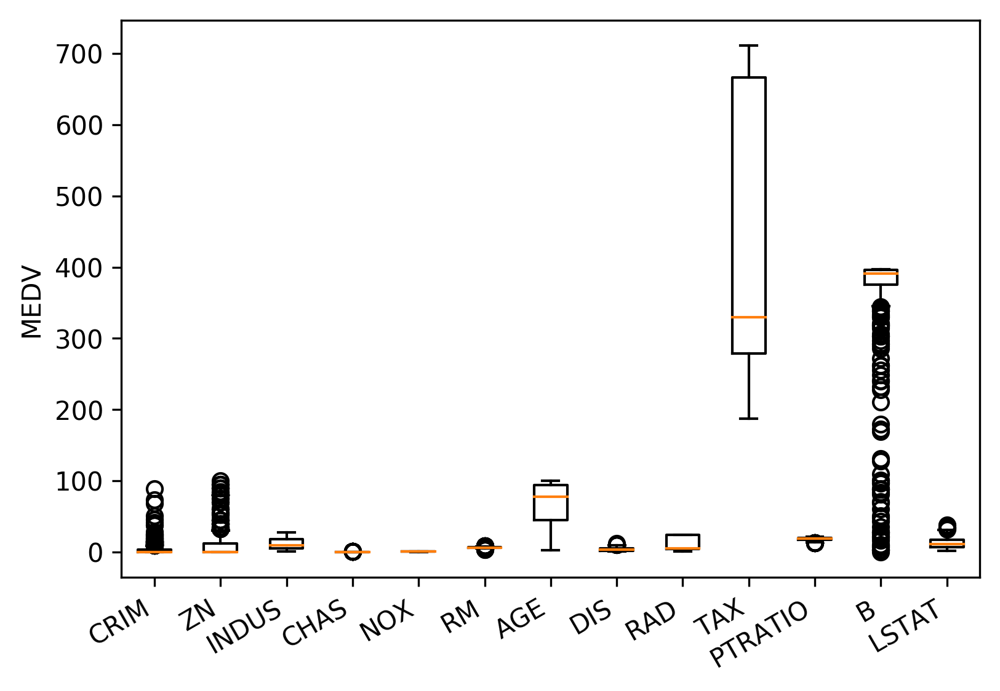

In [213]:
plt.boxplot(X)
plt.xticks(np.arange(1, X.shape[1] + 1), boston.feature_names, rotation=30, ha="right")
plt.ylabel("MEDV")

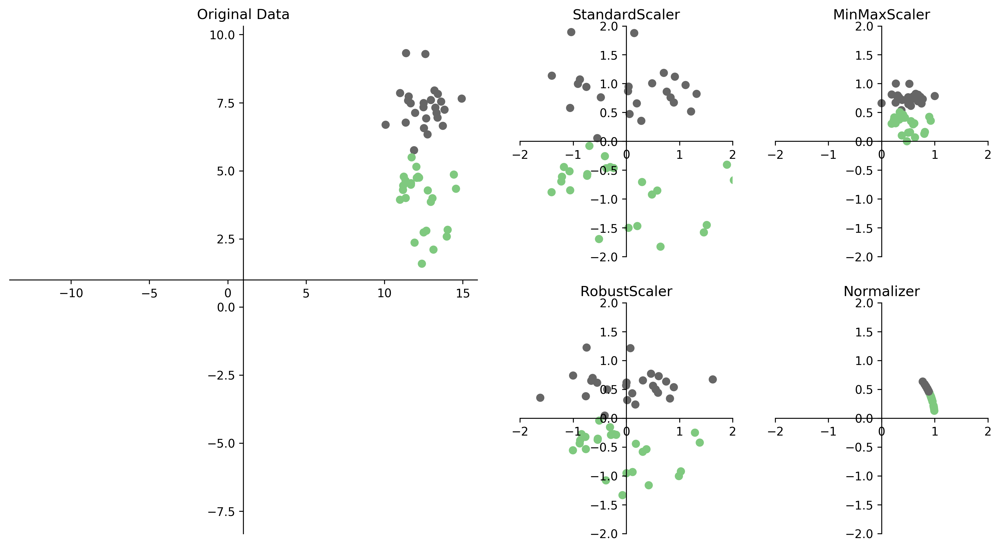

In [191]:
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, Normalizer

X, y = make_blobs(n_samples=50, centers=2, random_state=4, cluster_std=1)
X += 3 

plt.figure(figsize=(15, 8))
main_ax = plt.subplot2grid((2, 4), (0, 0), rowspan=2, colspan=2)

main_ax.scatter(X[:, 0], X[:, 1], c=y, cmap="Accent")
maxx = np.abs(X[:, 0]).max()
maxy = np.abs(X[:, 1]).max()

main_ax.set_xlim(-maxx + 1, maxx + 1)
main_ax.set_ylim(-maxy + 1, maxy + 1)
main_ax.set_title("Original Data")
other_axes = [plt.subplot2grid((2, 4), (i, j))
              for j in range(2, 4) for i in range(2)]

for ax, scaler in zip(other_axes, [StandardScaler(), RobustScaler(),
                                   MinMaxScaler(), Normalizer(norm='l2')]):
    X_ = scaler.fit_transform(X)
    ax.scatter(X_[:, 0], X_[:, 1], c=y, cmap="Accent")
    ax.set_xlim(-2, 2)
    ax.set_ylim(-2, 2)
    ax.set_title(type(scaler).__name__)

other_axes.append(main_ax)

for ax in other_axes:
    ax.spines['left'].set_position('center')
    ax.spines['right'].set_color('none')
    ax.spines['bottom'].set_position('center')
    ax.spines['top'].set_color('none')
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')


In [7]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

In [177]:
scores = cross_val_score(RidgeCV(), X_train, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.71718655233314066, 0.12521148650633437)

In [178]:
scores = cross_val_score(RidgeCV(), X_train_scaled, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.71789046947346136, 0.12695447250917097)

In [181]:
from sklearn.neighbors import KNeighborsRegressor
scores = cross_val_score(KNeighborsRegressor(), X_train, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.49871865806668803, 0.14628381664585244)

In [180]:
from sklearn.neighbors import KNeighborsRegressor
scores = cross_val_score(KNeighborsRegressor(), X_train_scaled, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.74979219238995831, 0.10573244928159024)

# Pipelines

In [197]:
from sklearn.linear_model import Ridge
X, y = boston.data, boston.target
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
ridge = Ridge().fit(X_train_scaled, y_train)

X_test_scaled = scaler.transform(X_test)
ridge.score(X_test_scaled, y_test)

0.63448846877867426

In [198]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(StandardScaler(), Ridge())
pipe.fit(X_train, y_train)
pipe.score(X_test, y_test)

0.63448846877867426

In [199]:
from sklearn.neighbors import KNeighborsRegressor
knn_pipe = make_pipeline(StandardScaler(), KNeighborsRegressor())
scores = cross_val_score(knn_pipe, X_train, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.74531180733825564, 0.10614366233973388)

In [206]:
print(knn_pipe.steps)

[('standardscaler', StandardScaler(copy=True, with_mean=True, with_std=True)), ('kneighborsregressor', KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
          metric_params=None, n_jobs=1, n_neighbors=5, p=2,
          weights='uniform'))]


In [207]:
from sklearn.pipeline import Pipeline
pipe = Pipeline((("scaler", StandardScaler()),
                 ("regressor", KNeighborsRegressor)))

In [210]:
from sklearn.model_selection import GridSearchCV

knn_pipe = make_pipeline(StandardScaler(), KNeighborsRegressor())
param_grid = {'kneighborsregressor__n_neighbors': range(1, 10)}
grid = GridSearchCV(knn_pipe, param_grid, cv=10)
grid.fit(X_train, y_train)
print(grid.best_params_)
print(grid.score(X_test, y_test))

{'kneighborsregressor__n_neighbors': 7}
0.600015753391


# Feature Distributions

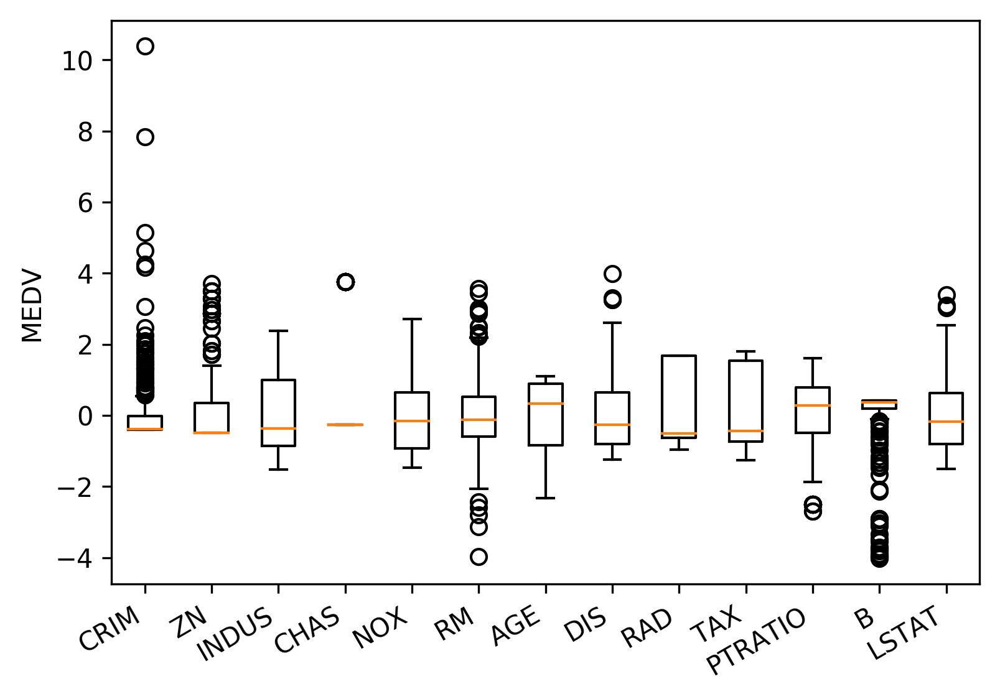

In [214]:
plt.boxplot(X_train_scaled)
plt.xticks(np.arange(1, X.shape[1] + 1), boston.feature_names, rotation=30, ha="right")
plt.ylabel("MEDV")

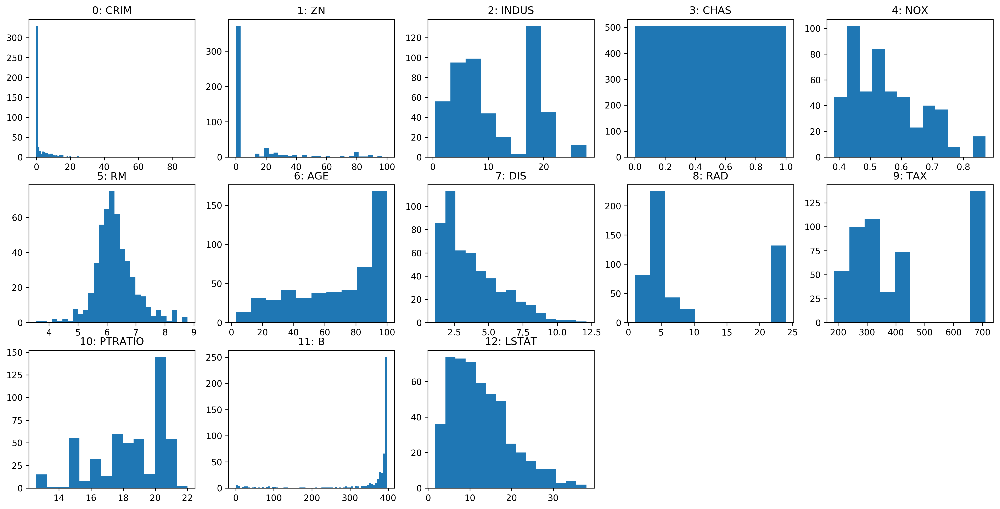

In [215]:
fig, axes = plt.subplots(3, 5, figsize=(20, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 12:
        ax.set_visible(False)
        continue
    ax.hist(X[:, i], bins="auto")
    ax.set_title("{}: {}".format(i, boston.feature_names[i]))

In [216]:
def bc(x, l):
    if l == 0:
        return np.log(x)
    else:
        return (x ** l - 1) / l


In [222]:
line = np.arange(1e-10, 10, 100)

In [223]:
line

array([  1.00000000e-10])

(0, 10)

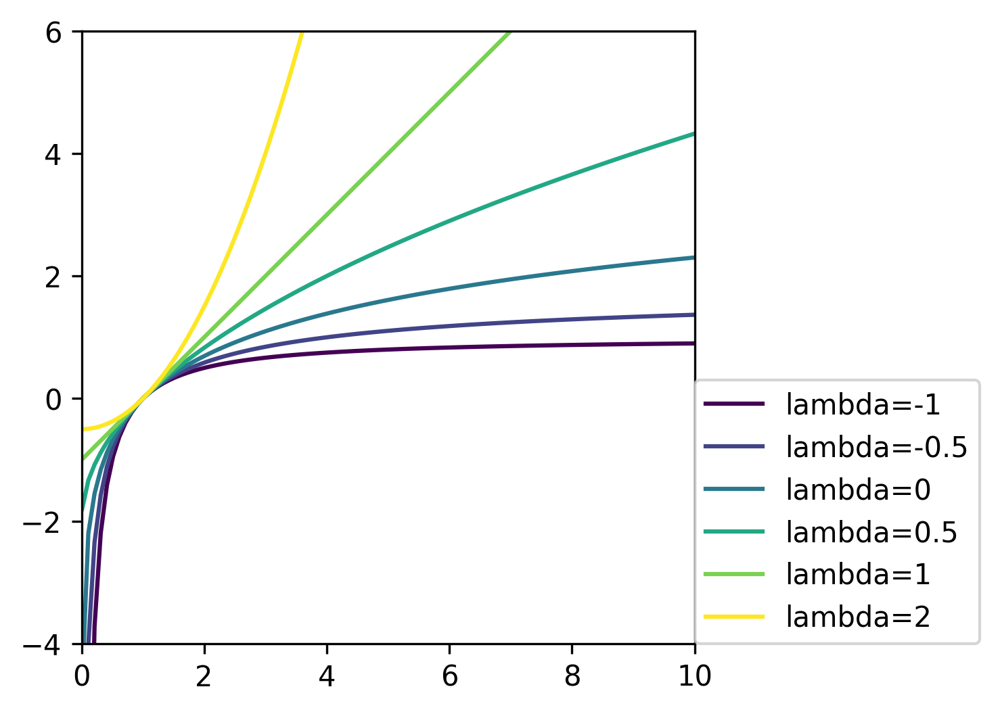

In [241]:
line = np.linspace(.01, 10, 100)
colors =  [plt.cm.viridis(i) for i in np.linspace(0, 1, 6)]
for l, c in zip([-1, -.5, 0, .5, 1, 2], colors):
    plt.plot(line, bc(line, l), label="lambda={}".format(l), color=c)
plt.ylim(-4, 6)
plt.gca().set_aspect("equal")
plt.legend(loc=(1, 0))
plt.xlim(0, 10)

In [20]:
from sklearn.preprocessing import MinMaxScaler
X_train_mm = MinMaxScaler().fit_transform(X_train)

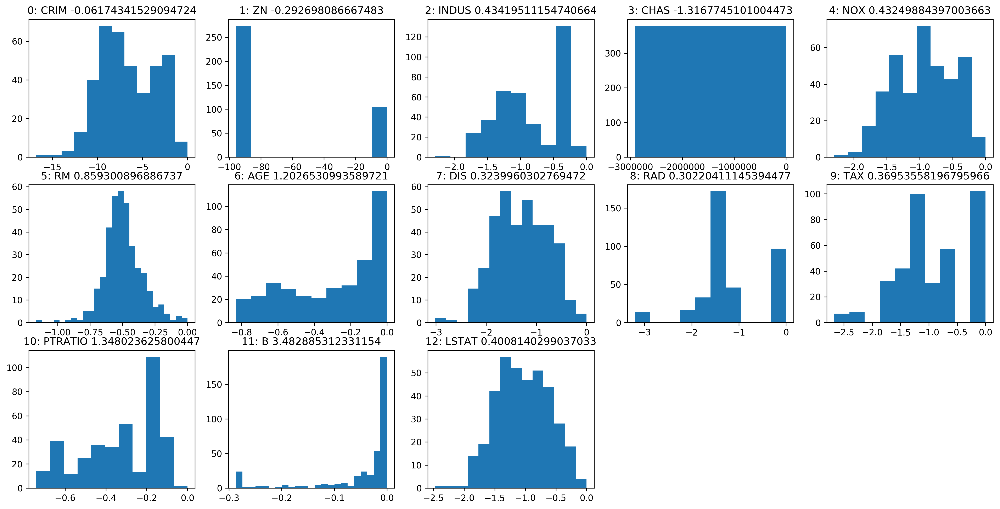

In [22]:
fig, axes = plt.subplots(3, 5, figsize=(20, 10))
X_bc = []
for i, ax in enumerate(axes.ravel()):
    if i > 12:
        ax.set_visible(False)
        continue
    x, lambda_x = stats.boxcox(X_train_mm[:, i] + 1e-5)
    X_bc.append(x)
    ax.hist(x, bins="auto")
    ax.set_title("{}: {} {}".format(i, boston.feature_names[i], lambda_x))

In [25]:
X_bc = np.array(X_bc).T

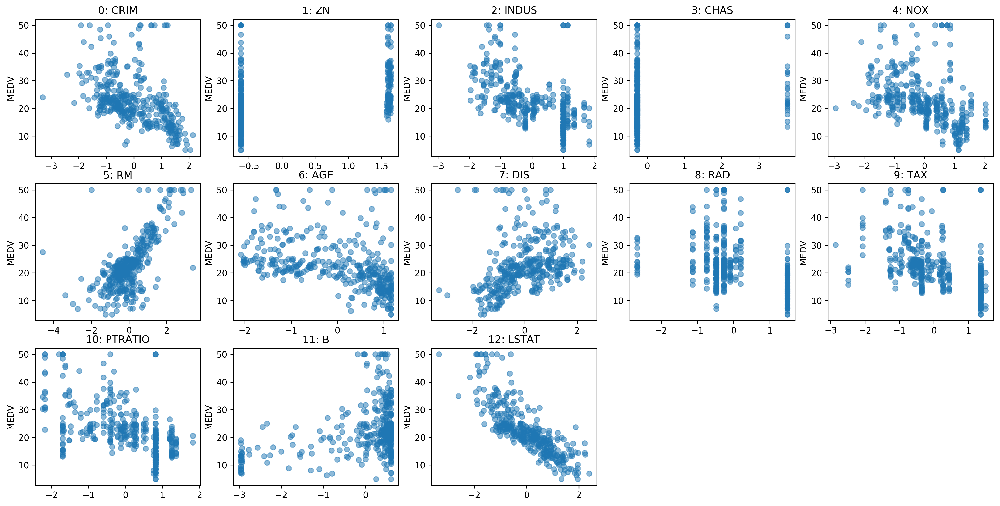

In [29]:
X_bc_scaled = StandardScaler().fit_transform(X_bc)
fig, axes = plt.subplots(3, 5, figsize=(20, 10))
for i, ax in enumerate(axes.ravel()):
    if i > 12:
        ax.set_visible(False)
        continue
    ax.plot(X_bc_scaled[:, i], y_train, 'o', alpha=.5)
    ax.set_title("{}: {}".format(i, boston.feature_names[i]))
    ax.set_ylabel("MEDV")

In [31]:
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import cross_val_score

scores = cross_val_score(RidgeCV(), X_train, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.71718655233314066, 0.12521148650633437)

In [36]:
scores = cross_val_score(RidgeCV(), X_train_scaled, y_train, cv=10)
print(np.mean(scores), np.std(scores))


0.717890469473 0.126954472509


In [33]:
scores = cross_val_score(RidgeCV(), X_bc_scaled, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.75938668786977215, 0.081102768502434197)

In [37]:
ridge = RidgeCV().fit(X_train_scaled, y_train)
ridge_bc = RidgeCV().fit(X_bc_scaled, y_train)

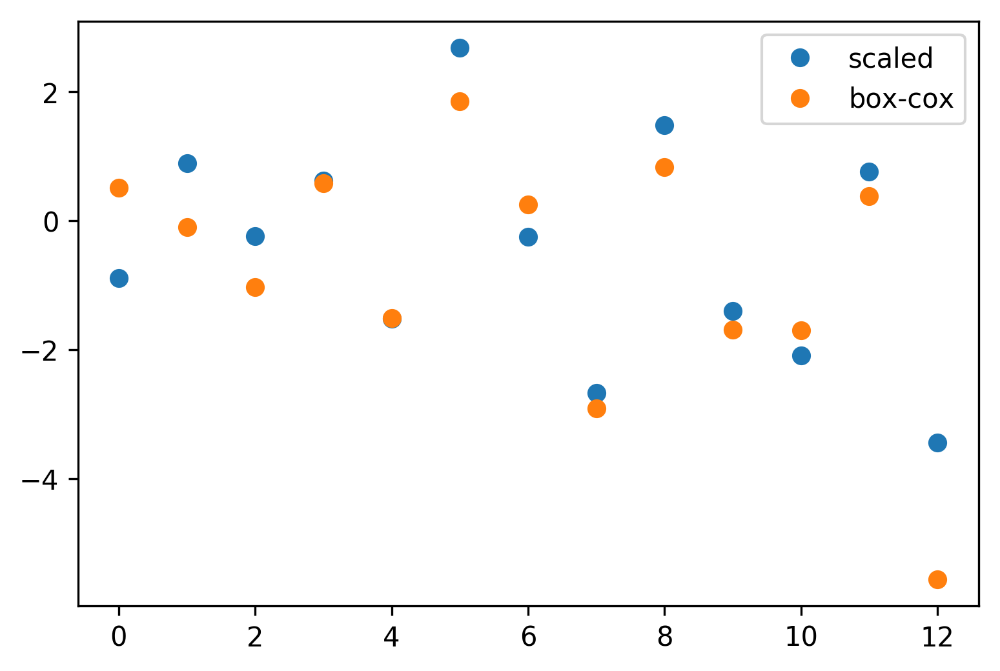

In [39]:
plt.plot(ridge.coef_, 'o', label="scaled")
plt.plot(ridge_bc.coef_, 'o', label="box-cox")
plt.legend()

In [252]:
# Categorical Variables

In [247]:
import pandas as pd
df = pd.DataFrame({'salary': [103, 89, 142, 54, 63, 219],
                   'boro': ['Manhatten', 'Queens', 'Manhatten', 'Brooklyn', 'Brooklyn', 'Bronx']})
df

,boro,salary
0,Manhatten,103
1,Queens,89
2,Manhatten,142
3,Brooklyn,54
4,Brooklyn,63
5,Bronx,219


In [248]:
pd.get_dummies(df)

,salary,boro_Bronx,boro_Brooklyn,boro_Manhatten,boro_Queens
0,103,0.0,0.0,1.0,0.0
1,89,0.0,0.0,0.0,1.0
2,142,0.0,0.0,1.0,0.0
3,54,0.0,1.0,0.0,0.0
4,63,0.0,1.0,0.0,0.0
5,219,1.0,0.0,0.0,0.0


In [249]:
df = pd.DataFrame({'salary': [103, 89, 142, 54, 63, 219],
                   'boro': [0, 1,0, 2, 2, 3]})
df

,boro,salary
0,0,103
1,1,89
2,0,142
3,2,54
4,2,63
5,3,219


In [253]:
pd.get_dummies(df, columns=['boro'])

,salary,boro_0,boro_1,boro_2,boro_3
0,103,1.0,0.0,0.0,0.0
1,89,0.0,1.0,0.0,0.0
2,142,1.0,0.0,0.0,0.0
3,54,0.0,0.0,1.0,0.0
4,63,0.0,0.0,1.0,0.0
5,219,0.0,0.0,0.0,1.0


In [258]:
df2 = pd.DataFrame({'salary': [73, 98, 204, 54],
                   'boro': ['Staten Island', 'Manhatten', 'Brooklyn', 'Bronx']})
df2

,boro,salary
0,Staten Island,73
1,Manhatten,98
2,Brooklyn,204
3,Bronx,54


In [259]:
pd.get_dummies(df2)

,salary,boro_Bronx,boro_Brooklyn,boro_Manhatten,boro_Staten Island
0,73,0.0,0.0,0.0,1.0
1,98,0.0,0.0,1.0,0.0
2,204,0.0,1.0,0.0,0.0
3,54,1.0,0.0,0.0,0.0


In [264]:
import pandas as pd
df = pd.DataFrame({'salary': [103, 89, 142, 54, 63, 219],
                   'boro': ['Manhatten', 'Queens', 'Manhatten', 'Brooklyn', 'Brooklyn', 'Bronx']})
df.boro = df.boro.astype("category", categories=['Manhatten', 'Queens', 'Brooklyn', 'Bronx', 'Staten Island'])
pd.get_dummies(df)

,salary,boro_Manhatten,boro_Queens,boro_Brooklyn,boro_Bronx,boro_Staten Island
0,103,1.0,0.0,0.0,0.0,0.0
1,89,0.0,1.0,0.0,0.0,0.0
2,142,1.0,0.0,0.0,0.0,0.0
3,54,0.0,0.0,1.0,0.0,0.0
4,63,0.0,0.0,1.0,0.0,0.0
5,219,0.0,0.0,0.0,1.0,0.0


In [271]:
from sklearn.preprocessing import OneHotEncoder

df = pd.DataFrame({'salary': [103, 89, 142, 54, 63, 219],
                   'boro': [0, 1, 0, 2, 2, 3]})
X = df.values
ohe = OneHotEncoder(categorical_features=[0]).fit(X)
ohe.transform(X).toarray()

array([[   1.,    0.,    0.,    0.,  103.],
       [   0.,    1.,    0.,    0.,   89.],
       [   1.,    0.,    0.,    0.,  142.],
       [   0.,    0.,    1.,    0.,   54.],
       [   0.,    0.,    1.,    0.,   63.],
       [   0.,    0.,    0.,    1.,  219.]])

# Feature Engineering

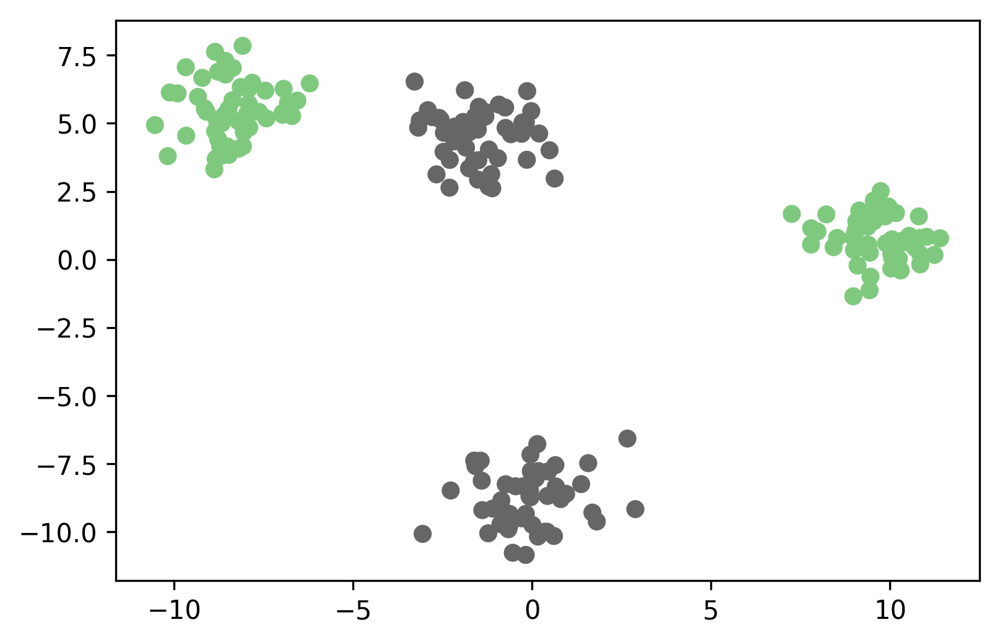

In [284]:
from sklearn.datasets import make_blobs
X, y = make_blobs(n_samples=200, centers=4, random_state=7)
y = y % 2
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='Accent')

In [285]:
from sklearn.linear_model import LogisticRegressionCV
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)
for i i
logreg = LogisticRegressionCV().fit(X_train, y_train)
logreg.score(X_train, y_train)

X_interaction = np.hstack([X, X[:, :0] * X[:, 1:]])
X_i_train, X_i_test, y_train, y_test = train_test_split(X_interaction, y, random_state=0)

logreg = LogisticRegressionCV().fit(X_i_train, y_train)
logreg.score(X_i_train, y_train)

0.70666666666666667

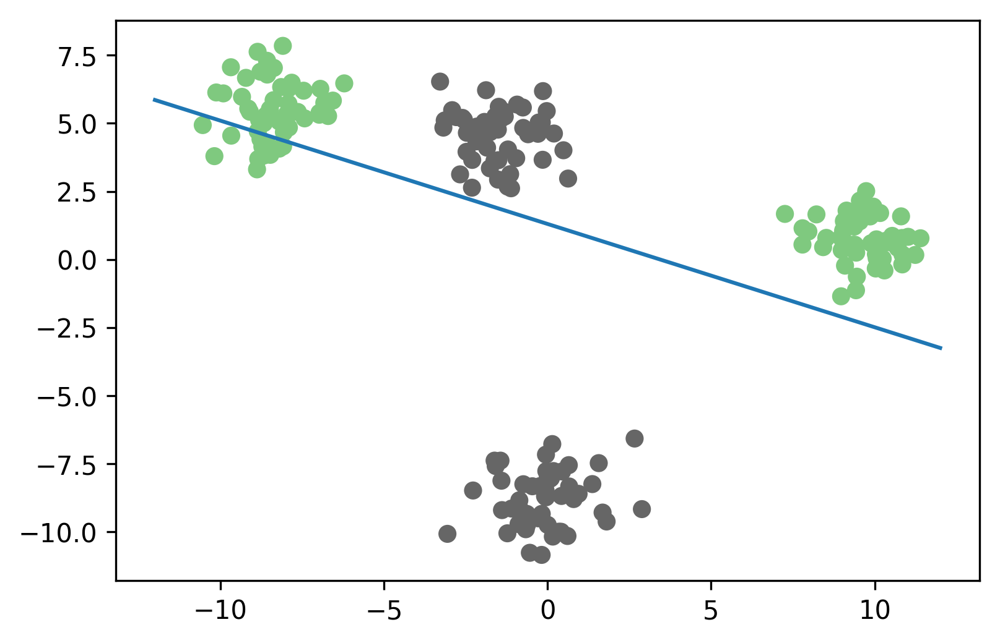

In [289]:
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='Accent')
line = np.linspace(-12, 12, 10)
coef = logreg.coef_.ravel()
plt.plot(line, -(coef[0] * line + logreg.intercept_) / coef[1])

0.70666666666666667

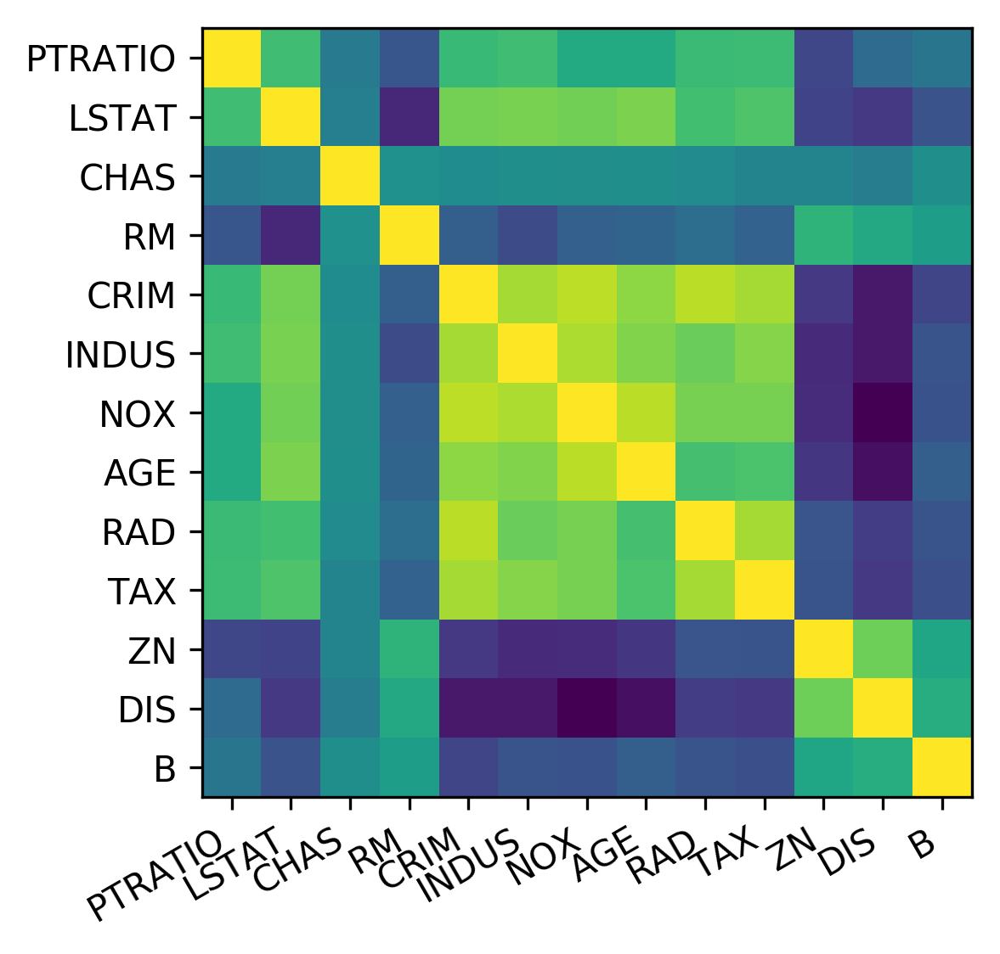

In [66]:
from sklearn.cluster.bicluster import SpectralCoclustering
cov = np.cov(X_bc_scaled.T)
coclust = SpectralCoclustering(n_clusters=4).fit(cov)
inds = np.argsort(coclust.row_labels_)
plt.imshow(cov[:, inds][inds, :])
plt.xticks(np.arange(X.shape[1]), np.array(boston.feature_names)[inds], rotation=30, ha="right")
plt.yticks(np.arange(X.shape[1]), np.array(boston.feature_names)[inds]);

In [67]:
from sklearn.preprocessing import PolynomialFeatures

In [81]:
poly = PolynomialFeatures()
X_bc_poly = poly.fit_transform(X_bc_scaled)

In [69]:
scores = cross_val_score(RidgeCV(), X_bc_poly, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.86528575688853915, 0.080389451676537382)

In [144]:
from sklearn.linear_model import LassoCV, Lasso
scores = cross_val_score(LassoCV(cv=10), X_bc_poly, y_train, cv=10)
np.mean(scores), np.std(scores)

/home/andy/checkout/scikit-learn/sklearn/linear_model/coordinate_descent.py:484: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/andy/checkout/scikit-learn/sklearn/linear_model/coordinate_descent.py:484: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/andy/checkout/scikit-learn/sklearn/linear_model/coordinate_descent.py:484: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/andy/checkout/scikit-learn/sklearn/linear_model/coordinate_descent.py:484: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting dat

(0.84503569203525009, 0.10124555041294417)

In [123]:
lasso = LassoCV(max_iter=10000, cv=10).fit(X_bc_poly, y_train)

In [124]:
lasso.mse_path_.shape

(100, 10)

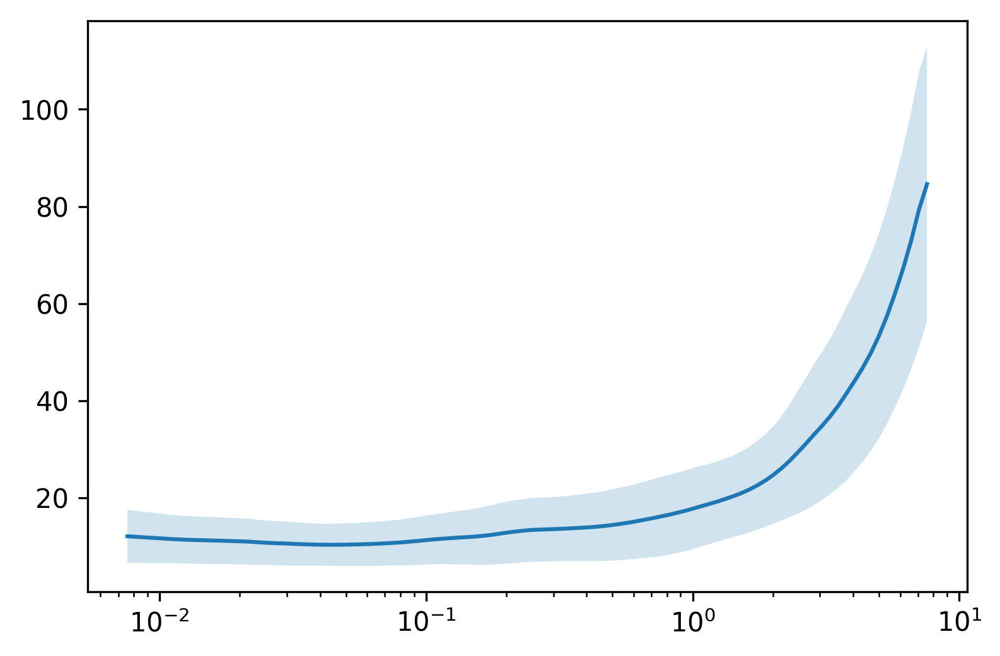

In [130]:
mean = np.mean(lasso.mse_path_, axis=1)
std = np.std(lasso.mse_path_, axis=1)
plt.plot(lasso.alphas_, mean)
plt.fill_between(lasso.alphas_,
                 mean + std,
                 mean - std, alpha=0.2)
plt.xscale("log")

In [138]:
lasso = Lasso(alpha=.1).fit(X_bc_poly, y_train)

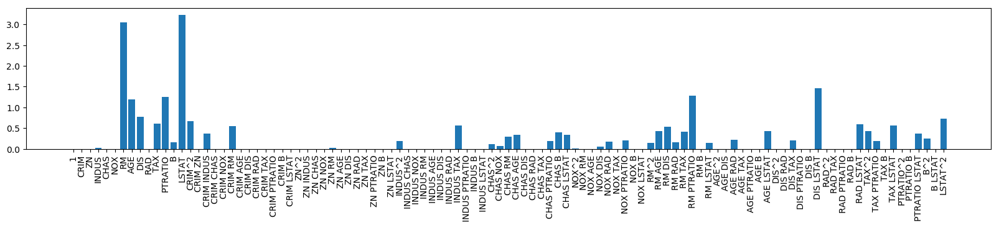

In [139]:
plt.figure(dpi=100, figsize=(20, 3))
plt.bar(range(lasso.coef_.shape[0]), np.abs(lasso.coef_))
plt.xticks(range(lasso.coef_.shape[0]), poly.get_feature_names(boston.feature_names), rotation=90, ha="center");

In [140]:
from sklearn.feature_selection import SelectFromModel
select = SelectFromModel(lasso, prefit=True)

In [141]:
X_selected = np.hstack([X_bc_scaled, select.transform(X_bc_poly)])

In [142]:
X_selected.shape

(379, 56)

In [174]:
scores = cross_val_score(RidgeCV(), X_selected, y_train, cv=10)
np.mean(scores), np.std(scores)

(0.88271349649427644, 0.070449059947911091)

In [175]:
scores

array([ 0.94478102,  0.90848903,  0.72073806,  0.81759274,  0.90985971,
        0.90460807,  0.82698302,  0.94401853,  0.96360007,  0.8864647 ])

In [152]:
poly_feature_names = select.transform(np.array(poly.get_feature_names(boston.feature_names)).reshape(1, -1)).ravel()

In [153]:
new_feature_names = np.hstack([boston.feature_names, poly_feature_names])

In [154]:
new_feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT', 'INDUS', 'RM', 'AGE', 'DIS', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'CRIM^2', 'CRIM INDUS', 'CRIM RM', 'ZN RM',
       'INDUS^2', 'INDUS TAX', 'CHAS^2', 'CHAS NOX', 'CHAS RM', 'CHAS AGE',
       'CHAS PTRATIO', 'CHAS B', 'CHAS LSTAT', 'NOX^2', 'NOX DIS',
       'NOX RAD', 'NOX PTRATIO', 'RM^2', 'RM AGE', 'RM DIS', 'RM RAD',
       'RM TAX', 'RM PTRATIO', 'RM LSTAT', 'AGE RAD', 'AGE LSTAT',
       'DIS TAX', 'DIS LSTAT', 'RAD LSTAT', 'TAX^2', 'TAX PTRATIO',
       'TAX LSTAT', 'PTRATIO LSTAT', 'B^2', 'LSTAT^2'], 
      dtype='<U13')

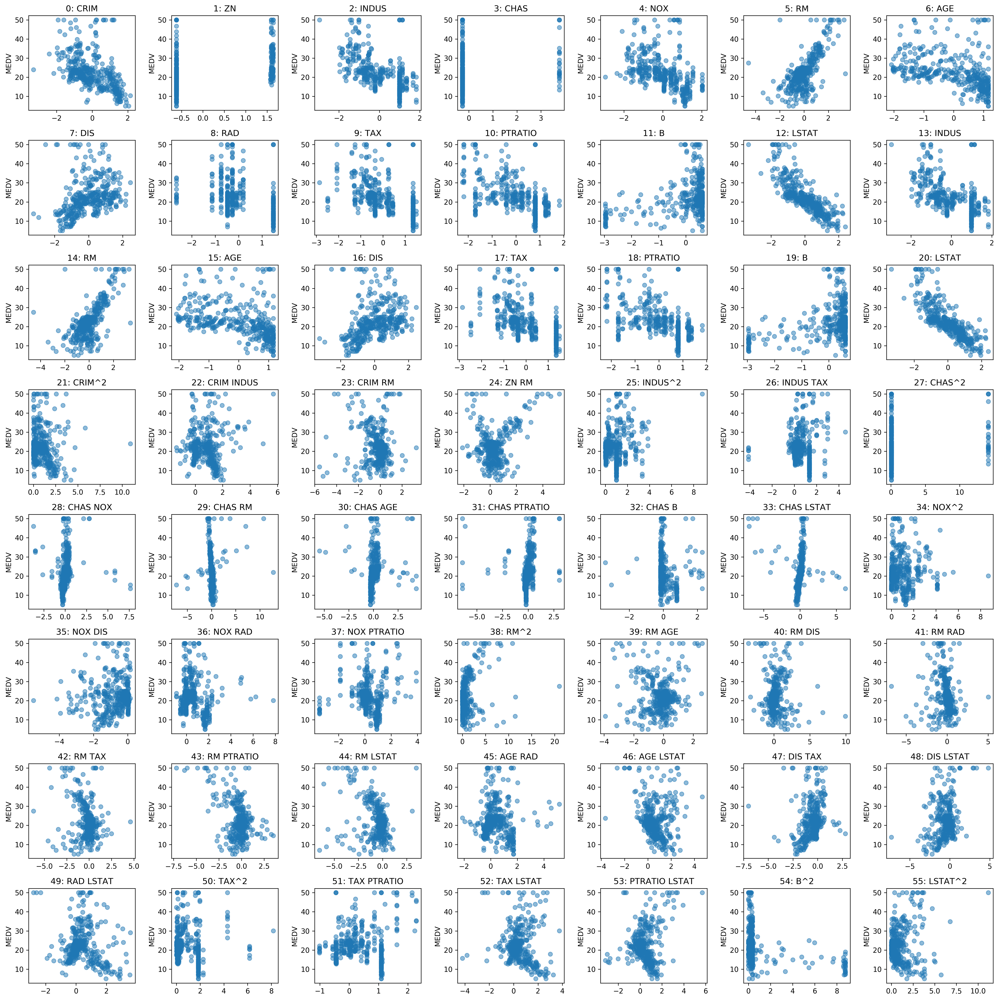

In [157]:
fig, axes = plt.subplots(8, 7, figsize=(20, 20))
for i, ax in enumerate(axes.ravel()):
    ax.plot(X_selected[:, i], y_train, 'o', alpha=.5)
    ax.set_title("{}: {}".format(i, new_feature_names[i]))
    ax.set_ylabel("MEDV")
plt.tight_layout()

In [158]:
poly = PolynomialFeatures()
X_bc_poly_again = poly.fit_transform(X_selected)
lasso = LassoCV(max_iter=10000, cv=10).fit(X_bc_poly_again, y_train)

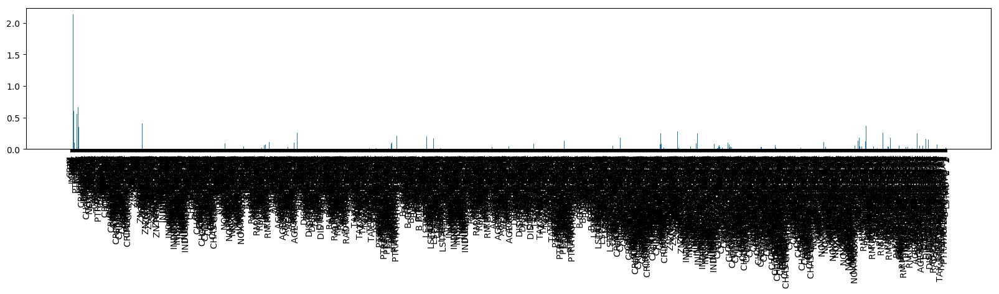

In [160]:
plt.figure(dpi=100, figsize=(20, 3))
plt.bar(range(lasso.coef_.shape[0]), np.abs(lasso.coef_))
plt.xticks(range(lasso.coef_.shape[0]), poly.get_feature_names(new_feature_names), rotation=90, ha="center");

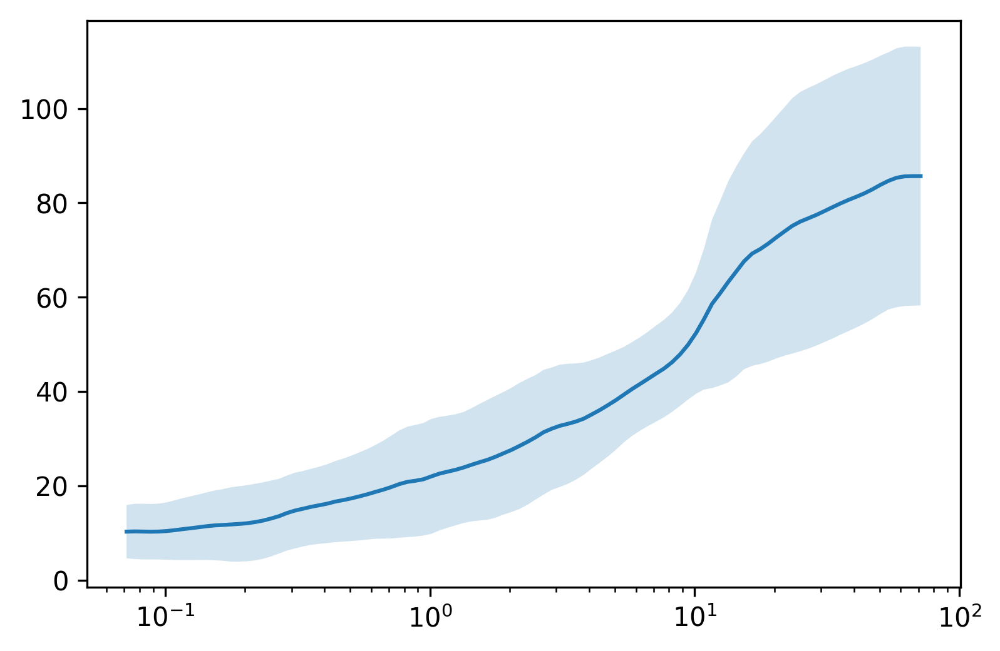

In [161]:
mean = np.mean(lasso.mse_path_, axis=1)
std = np.std(lasso.mse_path_, axis=1)
plt.plot(lasso.alphas_, mean)
plt.fill_between(lasso.alphas_,
                 mean + std,
                 mean - std, alpha=0.2)
plt.xscale("log")

In [162]:
select = SelectFromModel(lasso, prefit=True)
asdf = select.transform(X_bc_poly_again)

In [172]:
scores = cross_val_score(RidgeCV(), asdf, y_train, cv=10)
scores

array([ 0.9247222 ,  0.92093337,  0.87039241, -0.15761581,  0.94183923,
        0.86284894,  0.88428304,  0.93867294,  0.94464902,  0.95221116])

In [173]:
np.mean(scores)

0.80829364986065888